# Pachyderm-Seldon Deploy Integration: Monitoring and Provenance for Machine Learning Models

> This project was created by [Winder Research, an ML consultancy](https://WinderResearch.com), and funded by [Pachyderm](https://pachyderm.com).

[Pachyderm](https://pachyderm.com) is a data science platform that combines Data Lineage with End-to-End Pipelines.
[Seldon-Deploy](https://www.seldon.io/tech/products/deploy/) is the enterprise product that runs on top of [Seldon-Core](https://www.seldon.io/tech/products/core/) for rapidly deploying machine learning models.

This notebook shows how you can employ these platforms to monitor your live machine learning deployments for a number of issues (i.e. explainability, drift, outliers) through a dashboard, and automatically run training pipelines as new datasets become available. 
Furthermore, it shows how Pachyderm's provenance allows a quick response to those problems.
In brief, you will see how to *release, update, roll back, fix, re-release* machine learning models.

## Highlights

In live ML, dataset's statistics can change due to a variety of factors such as the dynamics of real-life scenarios, or even more drastically because of a pandemic (e.g. COVID-19).
Thus, to ensure the model quality meets the business requirements you need to be able to monitor and, in case, upgrade/downgrade your models.

Provenance comes in handy because it tracks exactly what factors produced a given model, provides repeatability and resiliency. This gives you the ability to test staging versions or do post-mortems on bad models.

Similarly, automation is the art of encoding a process to produce a deployed model. 
Without a process, you can't have provenance, since several people will perform the task in several different ways. If you can automate the process then you can remove the human-induced variance entirely and improve efficiency to boot.

When a model runs in production you need metrics to assure it behaves as expected. 
Monitoring allows you to inspect how the model operates, detect anomalies and inspect each prediction to explain what features are influencing the model's output.

## Example Situation

Imagine you work for CreditCo, an organization that uses machine learning to predict the creditworthiness of private individuals.
As a start, your organization begins with the openly available [Census Income dataset](https://archive.ics.uci.edu/ml/datasets/census+income) to determine whether a person makes over 50K a year based on their age, work class, gender, etc.

1. At first, CreditCo operates only in some US states and the income model works just fine. However, as soon as they launch their services in new locations, the income model becomes inadequate so they acquire new data and roll out a new version.
1. Unfortunately, the second model version is found to be influenced by controversial features and to avoid a scandal, CreditCo quickly rollback to the very first model. Provenance guarantees behaviour repeatability of any model version they had deployed before.
1. A third version is baked but this time the company is more cautious in the rollout strategy so they go for a *staging* deployment. Only after the validation process confirms *staging* is good enough, it's promoted to *production*.


The company is committed to protecting its reputation against any controversy.
Therefore, deployed models come with a monitoring facility that oversees the system and check if it is working according to the business policies.

* Unjustified credit denials can escalate quite quickly when they go public, so CreditCo need a safe guard to check what factors influence the model predictions.
* A large number of outlier requests can indicate the need for an investigation. 
* CreditCo is a rapidly growing company and so is their client userbase. They must be ready to acquire new data and re-train models quickly.

The solution is to have a data-driven model training process. 
When new data is available, it should kick-off a new training run. And ideally, all of this should be tracked and version-controlled for provenance.


I achieve this with Pachyderm pipelines, they're perfect for training models and manage their life-cycle; also, I use Seldon to deploy, run and monitor the models.

## Prerequistites

* A kubernetes cluster with `kubectl` configured
* A [Seldon Deploy](https://deploy-master.seldon.io/docs/getting-started/) cluster installed and configured with Request logging and Metrics components
* Pachyderm's `pachctl` binary installed following the [official documentation](https://docs.pachyderm.com/latest/getting_started/local_installation/#install-pachctl)
* The ability to pull Docker images from the public hub into your cluster. Alternatively, you can also build them locally.


I provide comprehensive installation instructions for:

* [Google Kubernetes Engine (GKE)](https://gitlab.com/winderresearch/pachyderm-seldon/seldon-alibi/-/tree/master/gke_install#pachyderm-seldon-demo-on-gke), tested on `v1.19.10-gke.1600`.
* A local [Minikube cluster](https://gitlab.com/winderresearch/pachyderm-seldon/seldon-alibi/-/tree/master/minikube_install#pachyderm-seldon-demo-on-minikube), tested on `Minikube v1.18.1`

Pachyderm is controlled and deployed via the `pachctl`. This document assumes that you have version `1.13.1` installed, although it should work with any `>= 1.13.x` version.

## Check Pachyderm installation

In [1]:
!pachctl version
!echo
!kubectl get po -A

COMPONENT           VERSION             
pachctl             1.13.1              
pachd               1.13.1              

NAMESPACE          NAME                                                            READY   STATUS             RESTARTS   AGE
cloud-run-system   cloud-run-operator-5b657b676f-p2nc5                             1/1     Running            0          3h31m
gke-system         cluster-local-gateway-666bb779cb-bglwc                          1/1     Running            0          3h31m
gke-system         istio-ingress-5fc7c57b8b-dx5p2                                  2/2     Running            0          3h31m
gke-system         istio-pilot-598fd74b78-hz6sh                                    1/1     Running            0          3h31m
knative-eventing   eventing-controller-69749677d6-7mb2h                            1/1     Running            0          3h31m
knative-eventing   eventing-webhook-56b46889c7-f2sdf                               1/1     Running            0     

To reach the Pachyderm cluster, make sure the port forwarding is running (in a separate terminal): 
```
pachctl port-forward --namespace pachyderm
```

From now on, I can access the Pachyderm Dashboard from http://localhost:30080 (registration required)

## Add Initial Training Data



Below I create a training data repository and populate it with the initial [Census Income dataset](https://archive.ics.uci.edu/ml/datasets/census+income), it's an excerpt from the US 1994 Census database. 
For demonstration purposes, I have altered the original data by filtering some data points, adding headers and transforming categorical to continuous variables with a [Target Encoder](https://contrib.scikit-learn.org/category_encoders/targetencoder.html).

Furthermore, for dataset versioning I use a sequence-based scheme (i.e. `v1`, `v2`, `v3`).

You'll have to wait a moment to see the data. I want to set up the automation so you can see it in action and first we need to create a data repo.

In [2]:
!pachctl create repo income_data

In [3]:
!pachctl create branch income_data@master

First, push training data `v1` to the related branch.

In [4]:
!pachctl create branch income_data@v1
!cd data && pachctl put file income_data@v1:/train.csv -f train_v1.csv

train_v1.csv 4.19MB / 5.69 MB [==========================>---------] 0s 0.00 b/s
train_v1.csv 4.19MB / 5.69 MB [==========================>---------] 0s 0.00 b/s
train_v1.csv 4.19MB / 5.69 MB [==========================>---------] 0s 0.00 b/s
train_v1.csv 4.19MB / 5.69 MB [==========================>---------] 0s 0.00 b/s
train_v1.csv 4.19MB / 5.69 MB [==========================>---------] 0s 0.00 b/s
train_v1.csv 4.19MB / 5.69 MB [==========================>---------] 0s 0.00 b/s
train_v1.csv 4.19MB / 5.69 MB [==========================>---------] 0s 0.00 b/s
train_v1.csv 4.19MB / 5.69 MB [==========================>---------] 0s 0.00 b/s
train_v1.csv 5.69MB / 5.69 MB [====================================] 0s 0.00 b/s
train_v1.csv 5.69MB / 5.69 MB [====================================] 0s 0.00 b/s
train_v1.csv 5.69MB / 5.69 MB [====================================] 0s 0.00 b/s
train_v1.csv 5.69MB / 5.69 MB [====================================] 0s 0.00 b/s
train_v1.csv 5.69MB / 5.69 M

In [5]:
!pachctl list commit income_data@v1

REPO        BRANCH COMMIT                           FINISHED               SIZE     PROGRESS DESCRIPTION
income_data v1     fa8e99c84baa495bb30edd35e7671eef Less than a second ago 5.422MiB -         


In [6]:
!pachctl list file income_data@v1

NAME       TYPE SIZE     
/train.csv file 5.422MiB 


Second, re-point the HEAD of `master` branch to `v1` ([see docs](https://docs.pachyderm.com/latest/concepts/advanced-concepts/deferred_processing/#change-the-head-of-your-branch));
this makes `train.csv` available on `master` but note this operation only moves the HEAD pointer, and doesn't really copy the file so it's quick and efficient. 

In [7]:
!pachctl create branch income_data@master --head v1

Verify `master` and `v1` point to the same commit hash.

In [8]:
!pachctl list branch income_data

BRANCH HEAD                             TRIGGER 
v1     fa8e99c84baa495bb30edd35e7671eef -       
master fa8e99c84baa495bb30edd35e7671eef -       


In [9]:
!pachctl list commit income_data@master

REPO        BRANCH COMMIT                           FINISHED      SIZE     PROGRESS DESCRIPTION
income_data v1     fa8e99c84baa495bb30edd35e7671eef 2 seconds ago 5.422MiB -         


In [10]:
!pachctl list file income_data@master

NAME       TYPE SIZE     
/train.csv file 5.422MiB 


At this point, I have created and populated a Pachyderm repo to host our initial training set.
Let's take a look at Pachyderm dashboard (head to http://localhost:30080).
It shows the details of one repository, later on, it'll display a full dependency graph with our pipelines.


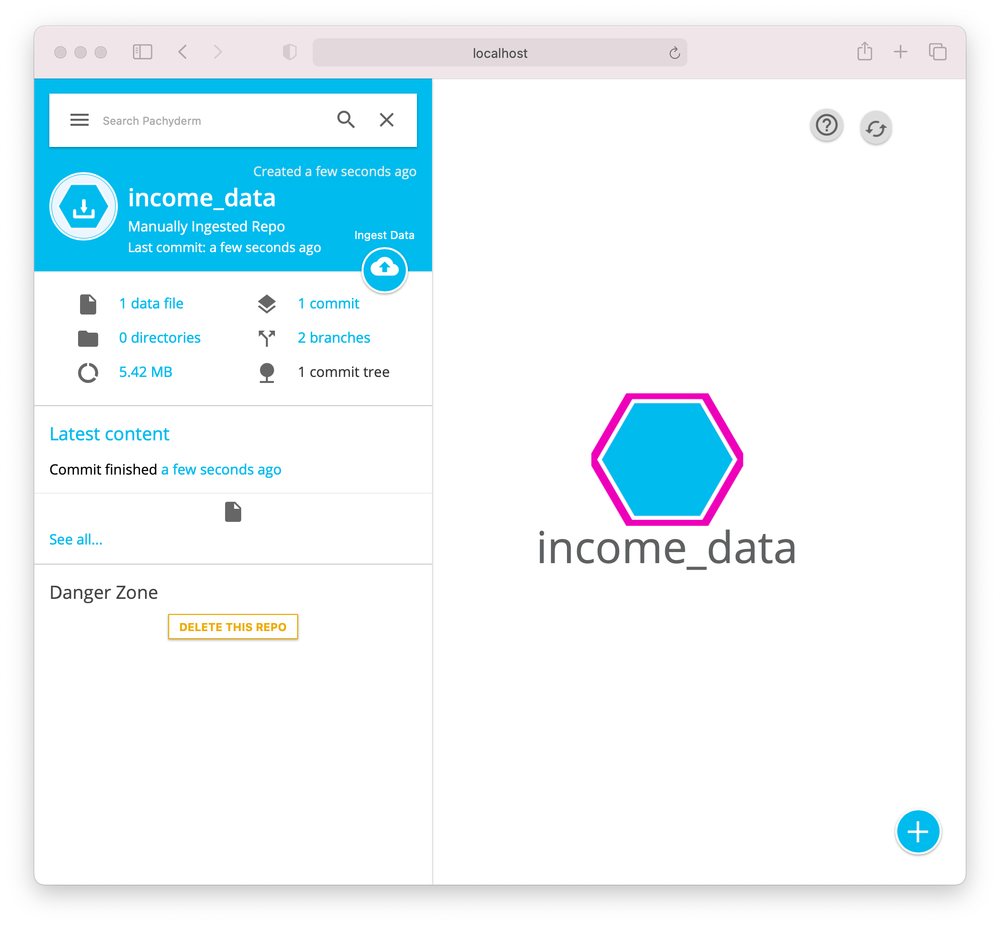

## Create an Income Model Training Pipeline

The training pipeline accepts data from a Pachyderm repository, trains a logistic regression forecasting model using the `Sklearn` python library, and produces a `joblib` file that holds the model parameters.

The pipeline uses a custom container to train the model. 
I'm not going to show it because it's really straightforward and builds a predictive model based upon a linear combination of the input variables.

In [11]:
%%writefile train.json
{
  "pipeline": {
    "name": "income_training"
  },
  "description": "A pipeline trains a Sklearn Logistic Regression model based on the provided income data.",
  "transform": {
    "image": "winderresearch/pachyderm-income-trainer:0.1.0",
    "cmd": [
      "python3",
      "/code/income_train.py",
      "/pfs/income_data/train.csv",
      "/pfs/out/model.joblib"
    ]
  },
  "parallelism_spec": {
    "constant": "1"
  },
  "input": {
    "pfs": {
      "repo": "income_data",
      "glob": "/"
    }
  }
}

Overwriting train.json


In [12]:
!pachctl delete pipeline income_training
!pachctl create pipeline -f train.json
!pachctl flush commit income_training@master --raw > /dev/null 2>&1

In [13]:
!pachctl list pipeline income_training
!echo
!pachctl list job -p income_training

NAME            VERSION INPUT         CREATED        STATE / LAST JOB  DESCRIPTION                                                                              
income_training 1       income_data:/ 16 seconds ago running / success A pipeline trains a Sklearn Logistic Regression model based on the provided income data. 

ID                               PIPELINE        STARTED        DURATION  RESTART PROGRESS  DL       UL   STATE   
b090dc10d61c4fa0bc07ec0445eb2963 income_training 10 seconds ago 9 seconds 0       1 + 0 / 1 5.422MiB 878B success 


In [14]:
!pachctl logs --pipeline=income_training

Loading data set from /pfs/income_data/train.csv
Training model...
Model trained!
model coefficients:
           feature  coefficient
6     Relationship     3.926088
4        Education     3.764938
7       Occupation     3.107477
5   Marital Status     2.071383
3   Hours per week     0.026409
0              Age     0.023956
2     Capital Loss     0.000637
1     Capital Gain     0.000305
8             Race    -1.388053
9              Sex    -1.728015
10  Native Country    -1.762689
Train accuracy:  0.8316546762589928
Saving model in /pfs/out/model.joblib
Model saved!


In [15]:
!pachctl list file income_training@master

NAME          TYPE SIZE 
/model.joblib file 878B 


## Create an Income Explainer Training Pipeline

The pipeline below generates an Anchors model using the [Seldon-Alibi Explainer libary](https://docs.seldon.io/projects/alibi/en/v0.5.5/methods/Anchors.html#id3) to explain the income model's predictions.
Anchors provide easy-to-interpret explanations by finding what features impacted a given prediction. 
A sample explanation is, pardon the pun, self-explanatory: *Hugo makes more than £50,000 because he is married and his age is between 35 and 45 years.*

To generate anchors, the algorithm requires both the training data and the trained model. A way to pass multiple inputs to a Pachyderm pipeline is using the `input.cross` spec, which in this case makes the two files available to the container ([see Pachyderm docs](https://docs.pachyderm.com/latest/reference/pipeline_spec/#cross-input) for further details).

Note the parameters passed into the training script (i.e. `${income_data_COMMIT}`, etc.). 
The commit hash is a special environmental variable provided to us by Pachyderm, specifying the new commit hash.
At each run, the training script labels the new explainer with the commit hashes provided.

The output is a `dill` file.

In [16]:
%%writefile explainer_train.json
{
  "pipeline": {
    "name": "explainer_training"
  },
  "description": "A pipeline trains a Seldon/Alibi Explainer.",
  "transform": {
    "image": "winderresearch/pachyderm-explainer-trainer:0.1.0",
    "cmd": ["/bin/bash"],
    "stdin": [
        "python3 /code/explainer_train.py /pfs/income_data/train.csv /pfs/income_training/model.joblib /pfs/out/ ${income_data_COMMIT} ${income_training_COMMIT}"
    ]
  },
  "parallelism_spec": {
    "constant": "1"
  },
  "input": {
      "cross": [
        {
            "pfs": {
              "repo": "income_data",
              "glob": "/"
            }
        },
        {
            "pfs": {
              "repo": "income_training",
              "glob": "/"
            }
        }
      ]
  }
}

Overwriting explainer_train.json


In [17]:
!pachctl delete pipeline explainer_training
!pachctl create pipeline -f explainer_train.json
!pachctl flush commit explainer_training@master --raw > /dev/null 2>&1

In [18]:
!pachctl list pipeline explainer_training
!echo
!pachctl list job -p explainer_training

NAME               VERSION INPUT                               CREATED        STATE / LAST JOB  DESCRIPTION                                 
explainer_training 1       (income_data:/ ⨯ income_training:/) 40 seconds ago running / success A pipeline trains a Seldon/Alibi Explainer. 

ID                               PIPELINE           STARTED        DURATION   RESTART PROGRESS  DL       UL       STATE   
b67dd1f9750c4657a08bf70f4cc10e46 explainer_training 34 seconds ago 33 seconds 0       1 + 0 / 1 5.423MiB 9.807MiB success 


In [19]:
!pachctl logs --pipeline=explainer_training

2021-07-07 20:13:14.309916: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2021-07-07 20:13:14.310393: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
IPython could not be loaded!
income_data_commit: fa8e99c84baa495bb30edd35e7671eef
income_training_commit: 78e545c768ea40ac83704b0632dbfb12
Loading income model from /pfs/income_training/model.joblib
Loading data set from /pfs/income_data/train.csv
Training Explainer...
Explainer trained!
Saving explainer in /pfs/out/
Explainer saved!


In [20]:
!pachctl list file explainer_training@master

NAME            TYPE SIZE     
/explainer.dill file 9.807MiB 


## Create a Drift Detector Explainer Training Pipeline

This pipeline creates a [Seldon-Alibi Kolmogorov-Smirnov](https://docs.seldon.io/projects/alibi-detect/en/stable/methods/ksdrift.html) drift detector which throws a red flag whenever the concept learned by the income model changes over time from its original statistical properties.
The result is a couple of `pickle` files holding the detector model and its metadata.

In [21]:
%%writefile drift.json
{
  "pipeline": {
    "name": "drift_training"
  },
  "description": "A pipeline creates a Seldon/Alibi Drift Detector.",
  "transform": {
    "image": "winderresearch/pachyderm-income-drift-trainer:0.1.0",
    "cmd": [
      "python3",
      "/code/drift_train.py",
      "/pfs/income_data/train.csv",
      "/pfs/out/drift_detector_dir"
    ]
  },
  "parallelism_spec": {
    "constant": "1"
  },
  "input": {
    "pfs": {
      "repo": "income_data",
      "glob": "/"
    }
  }
}

Overwriting drift.json


In [22]:
!pachctl delete pipeline drift_training
!pachctl create pipeline -f drift.json
!pachctl flush commit drift_training@master --raw > /dev/null 2>&1

In [23]:
!pachctl list pipeline drift_training
!echo
!pachctl list job -p drift_training

NAME           VERSION INPUT         CREATED        STATE / LAST JOB  DESCRIPTION                                       
drift_training 1       income_data:/ 18 seconds ago running / success A pipeline creates a Seldon/Alibi Drift Detector. 

ID                               PIPELINE       STARTED       DURATION  RESTART PROGRESS  DL       UL       STATE   
5f0bbdfa2e824e658395bba1b585a379 drift_training 9 seconds ago 8 seconds 0       1 + 0 / 1 5.422MiB 3.267MiB success 


In [24]:
!pachctl logs --pipeline=drift_training

2021-07-07 20:13:50.628282: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2021-07-07 20:13:50.628346: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
Directory /pfs/out/drift_detector_dir does not exist and is now created.
Loading data set from /pfs/income_data/train.csv
Creating drift detector...
Saving drift detector in /pfs/out/drift_detector_dir
Drift detector saved!


In [25]:
!pachctl list file drift_training@master

NAME                TYPE SIZE     
/drift_detector_dir dir  3.267MiB 


## Create an Outlier Detector Training Pipeline

The last training pipeline creates a [Seldon-Alibi Mahalanobis]( https://docs.seldon.io/projects/alibi-detect/en/v0.4.4/examples/od_mahalanobis_kddcup.html) outlier detector.
This model processes incoming requests (and not predictions!) by computing an outlier score and comparing it to a threshold.

The training script takes care of tuning the threshold value (warm-up), to do so the pipeline uses the training dataset file.
Similar to the previous pipeline, the output is two `pickle` files.

In [26]:
%%writefile outlier.json
{
  "pipeline": {
    "name": "outlier_training"
  },
  "description": "A pipeline creates a Seldon/Alibi Outlier Detector.",
  "transform": {
    "image": "winderresearch/pachyderm-income-outlier-trainer:0.1.0",
    "cmd": [
      "python3",
      "/code/outlier_detector_training.py",
      "/pfs/income_data/train.csv",
      "/pfs/out/outlier_detector_dir"
    ]
  },
  "parallelism_spec": {
    "constant": "1"
  },
  "input": {
    "pfs": {
      "repo": "income_data",
      "glob": "/"
    }
  }
}

Overwriting outlier.json


In [27]:
!pachctl delete pipeline outlier_training
!pachctl create pipeline -f outlier.json
!pachctl flush commit outlier_training@master --raw > /dev/null 2>&1

In [28]:
!pachctl list pipeline outlier_training
!echo
!pachctl list job -p outlier_training

NAME             VERSION INPUT         CREATED        STATE / LAST JOB  DESCRIPTION                                         
outlier_training 1       income_data:/ 13 seconds ago running / success A pipeline creates a Seldon/Alibi Outlier Detector. 

ID                               PIPELINE         STARTED       DURATION  RESTART PROGRESS  DL       UL       STATE   
890e58c5002e435d89e5ce5fbb6718f8 outlier_training 7 seconds ago 6 seconds 0       1 + 0 / 1 5.422MiB 1.676KiB success 


In [29]:
!pachctl logs --pipeline=outlier_training

2021-07-07 20:14:06.493143: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2021-07-07 20:14:06.493204: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
No threshold level set. Need to infer threshold using `infer_threshold`.
Directory /pfs/out/outlier_detector_dir does not exist and is now created.
Loading data set from /pfs/income_data/train.csv
Warming up detector...
Saving outlier detector in /pfs/out/outlier_detector_dir
Outlier detector saved!


In [30]:
!pachctl list file outlier_training@master

NAME                  TYPE SIZE     
/outlier_detector_dir dir  1.676KiB 


I've created lots of training pipelines above. 
To visualize the entire dependency graph let's open the Pachyderm dashboard (http://localhost:30080) again.

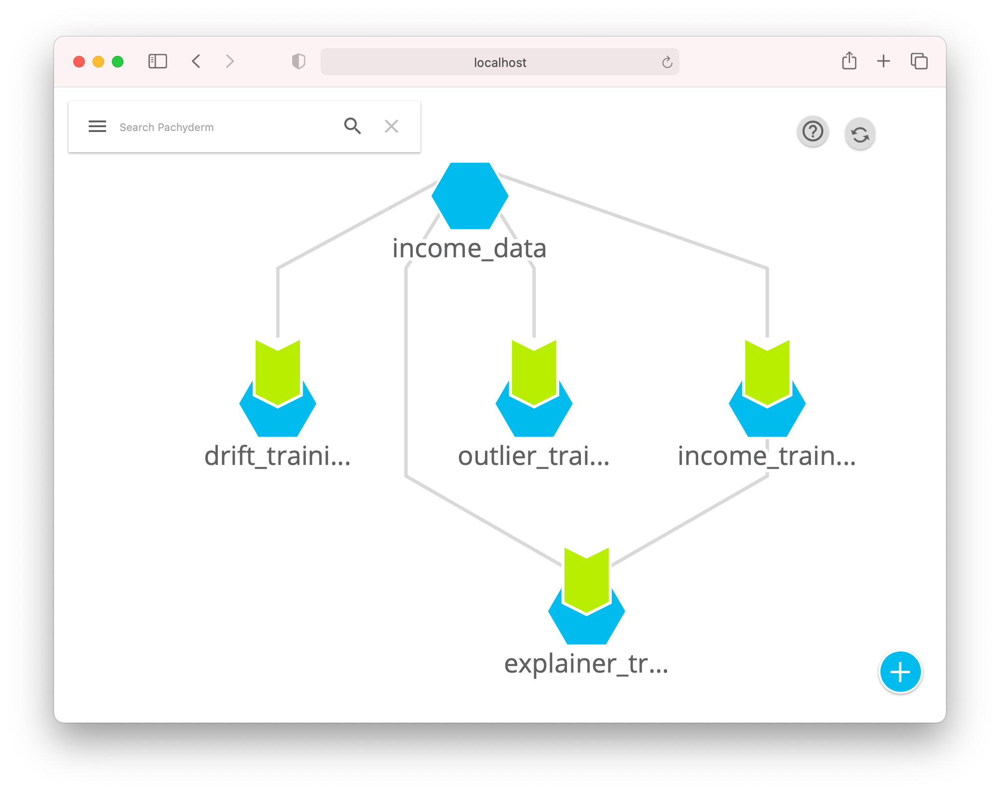

When a new dataset is pushed to `income_data` repo, Pachyderm automatically runs all pipelines downstream. A [pipeline execution is a *job*](https://docs.pachyderm.com/latest/concepts/pipeline-concepts/job/):

> Each job runs your code against the current commit and then submits the results to the output repository and creates a single output commit.

You may have noticed there's a chained dependency between `explainer_training` and `income_training`, but the graph is effectively acyclic, and Pachyderm schedules jobs in order such that `explainer_training` will read the correct (i.e., latest) commit of `income_training`.

## Create a Pipeline to host all models

For convenience, I create a pipeline that copies the models over.
Because it's all automated by Pachyderm, any new dataset push to `income_data` will result in fresh models being hosted on `copy_models` repo, in `master` branch.
Later, I'll create additional branches on `copy_models` to control the exact version I want to deploy; more details on this last step will follow.

In [31]:
%%writefile copy_models.json
{
  "pipeline": {
    "name": "copy_models"
  },
  "description": "A pipeline copies models over to a unique location.",
  "transform": {
    "image": "bash:5.1.8",
    "cmd": ["ln", "-s", "/pfs/dir/", "/pfs/out"]
  },
  "parallelism_spec": {
    "constant": "1"
  },
  "input": {
      "union": [
        {
            "pfs": {
              "name": "dir",
              "repo": "explainer_training",
              "glob": "/*",
              "empty_files": true
            }
        },
        {
            "pfs": {
              "name": "dir",
              "repo": "drift_training",
              "glob": "/*",
              "empty_files": true
            }
        },
        {
            "pfs": {
              "name": "dir",
              "repo": "outlier_training",
              "glob": "/*",
              "empty_files": true
            }
        },
        {
            "pfs": {
              "name": "dir",
              "repo": "income_training",
              "glob": "/*",
              "empty_files": true
            }
        }
      ]
  }
}

Overwriting copy_models.json


In [32]:
!pachctl delete pipeline copy_models
!pachctl create pipeline -f copy_models.json
!pachctl flush commit copy_models@master --raw > /dev/null 2>&1

In [33]:
!pachctl logs --pipeline=copy_models

In [34]:
!pachctl list file copy_models@master:/dir

NAME                      TYPE SIZE     
/dir/drift_detector_dir   dir  3.267MiB 
/dir/explainer.dill       file 9.807MiB 
/dir/model.joblib         file 878B     
/dir/outlier_detector_dir dir  1.676KiB 


### Important
It's almost time to deploy some models, and throughout this demo, I'll show you how to implement a specific rollout strategy. 
I'll use `copy_models` repo as the source of models, but if a deployment pipeline watched its `master` branch it'd fire anytime a dataset is pushed upstream, and nobody wants ML models going live without human supervision.

In the next steps, I set up two deployment pipelines to watch an ad-hoc branch called `deploy_production`.
This way, I can move its HEAD along the commit history to select which version I deploy.

In [35]:
!pachctl create branch copy_models@deploy_production

In [36]:
!pachctl list branch copy_models

BRANCH            HEAD                             TRIGGER 
deploy_production -                                -       
master            d07b382c0fdd464798803281ac6ab3f4 -       


## Create a Production Deployment Service

At this point you could kick off any old CD pipeline to deploy, but Pachyderm is perfectly capable, and you gain from the tight integration. For example, you could argue that the pipeline definition is static, and can reside in traditional CD systems, but the deployment is dynamic and data driven, so it makes more sense to keep it close to the data.

To do this, I create a custom deployer container that uses the [Seldon Deploy REST API](https://deploy.seldon.io/docs/tour-of-seldon-deploy/api/) to create a `SeldonDeployment`, it'll deploy all artifacts produced by the training pipelines above;  all that is done simply by a Python script.

This container is triggered by updating the `deploy_production` branch of `copy_models` (I show the exact mechanism to deploy in the next steps) and it uses the [`${S3_ENDPOINT}` enviroment variable](https://docs.pachyderm.com/latest/deploy-manage/deploy/environment-variables/) (it's an S3 URI) to instruct Seldon Deploy where to fetch the artifacts.


### Important
This one below is a special kind of pipeline called "service", it's meant not to process data but rather to expose it to the external world. 
When used in conjunction with a [`input.pfs.s3` spec](https://docs.pachyderm.com/latest/deploy-manage/manage/s3gateway/deploy-s3gateway-sidecar/), it makes the input repository available as an S3 bucket to anyone who connetcs to it.
I point the deployer script to the S3 service by passing the `${S3_ENDPOINT}` environment variable as a parameter.

In [37]:
%%writefile deploy_production.json
{
  "pipeline": {
    "name": "deploy_production"
  },
  "reprocess_spec": "every_job",
  "description": "A service deploys a set of Seldon components via the Seldon Deploy REST APIs.",
  "transform": {
    "image": "winderresearch/pachyderm-deployer:0.1.5",
    "cmd": ["/bin/bash"],
    "stdin": [
        "/usr/local/bin/python -u /deploy.py s3://copy_models ${KUBERNETES_SERVICE_HOST} ${S3_ENDPOINT} pachyderm ${copy_models_COMMIT}"
    ]
  },
  "parallelism_spec": {
    "constant": "1"
  },
  "input": {
    "pfs": {
      "repo": "copy_models",
      "branch": "deploy_production",
      "glob": "/",
      "s3": true
    }
  },
  "enable_stats": false,
  "service": {
        "external_port": 30888,
        "internal_port": 600
  }
}

Overwriting deploy_production.json


In [38]:
!pachctl delete pipeline deploy_production -f
!pachctl create pipeline -f deploy_production.json

The resulting DAG is:

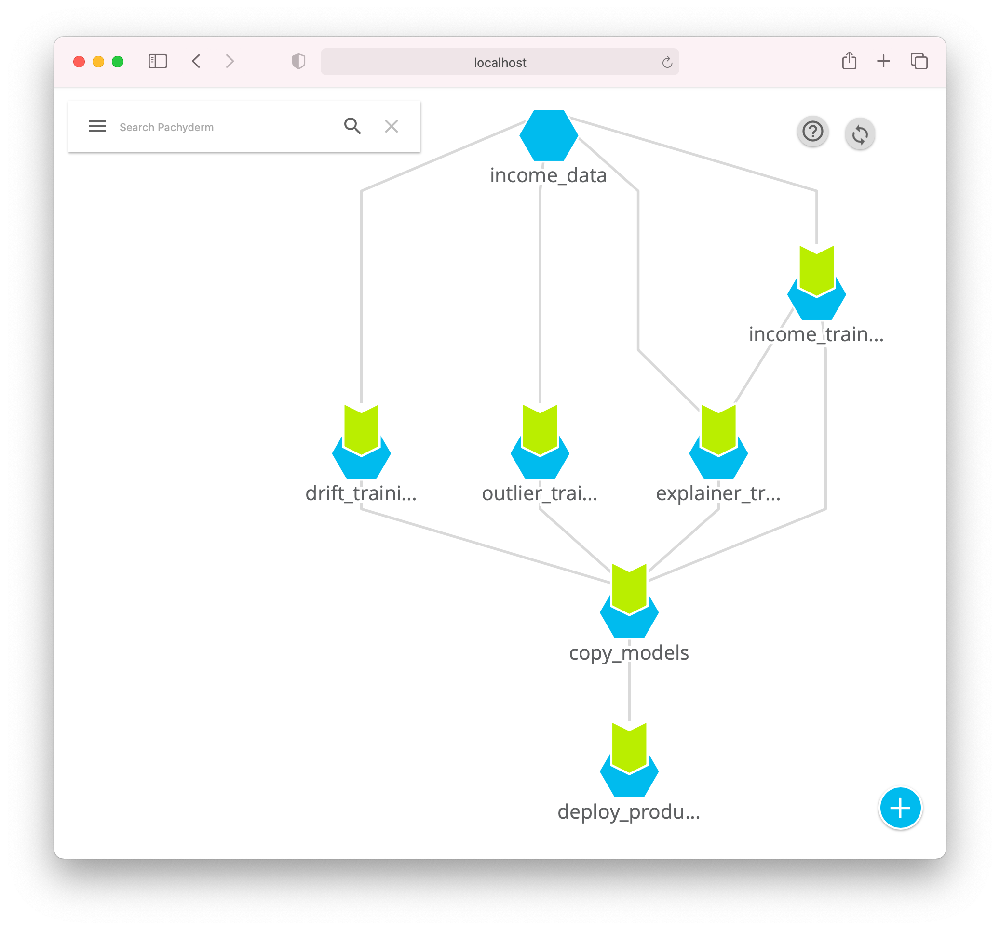

## Deploy `v1` model

Now that I've set up a deployment pipeline, let's go back to CreditCo sample story.
It's time for your organization to deploy their first ML income classification model. To begin with, CreditCo start with training on `v1` dataset and deploying it to production. 

I've already prepared the models trained on the `v1` dataset in `copy_models@master`, so to achieve the above I just need to trigger the production deployment pipeline by pointing the `deploy_production` branch to `master`. Again, it's worth mentioning this operation just moves a pointer and doesn't copy the files physically. Thus, it's fast and efficient, in a matter of moments the deployment starts.

In [39]:
!pachctl create branch copy_models@deploy_production --head master

The ball is now in Seldon's court.
You can see the deployment being launched in the UI: http://127.0.0.1:8000/seldon-deploy/deployments?ns=seldon.
The following cell waits until all containers roll out, it may take a few moments to complete but if you think something may be stuck then take a look at the pods in the `seldon` namespace.

In [40]:
!chmod +x wait_containers_rollout.sh
!./wait_containers_rollout.sh

Waiting for deployment "pachyderm-default-0-pachyderm-container" rollout to finish: 0 of 1 updated replicas are available...
deployment "pachyderm-default-0-pachyderm-container" successfully rolled out
Waiting for deployment "pachyderm-default-explainer" rollout to finish: 0 of 1 updated replicas are available...
deployment "pachyderm-default-explainer" successfully rolled out
deployment "seldon-seldondeployment-pachyderm-drift-00001-deployment" successfully rolled out
deployment "seldon-seldondeployment-pachyderm-outlier-00001-deployment" successfully rolled out


In [43]:
!pachctl logs --pipeline=deploy_production

Models bucket URI: s3://copy_models
Model version: d07b382c0fdd464798803281ac6ab3f4
K8s service host: 10.35.240.1
S3 endpoint: http://s3-5bc130ac52244f10a37f68035e6cc3fa.pachyderm:600
Deployment name: pachyderm
create_seldon_deployment OK
create_drift_detector_seldon_deployment OK
create_outlier_detector_seldon_deployment OK
SeldonDeployment not ready yet
SeldonDeployment not ready yet
SeldonDeployment not ready yet
SeldonDeployment not ready yet
SeldonDeployment not ready yet
SeldonDeployment not ready yet
SeldonDeployment not ready yet
SeldonDeployment not ready yet
SeldonDeployment not ready yet
SeldonDeployment not ready yet
SeldonDeployment not ready yet
SeldonDeployment not ready yet
SeldonDeployment is ready!
DONE


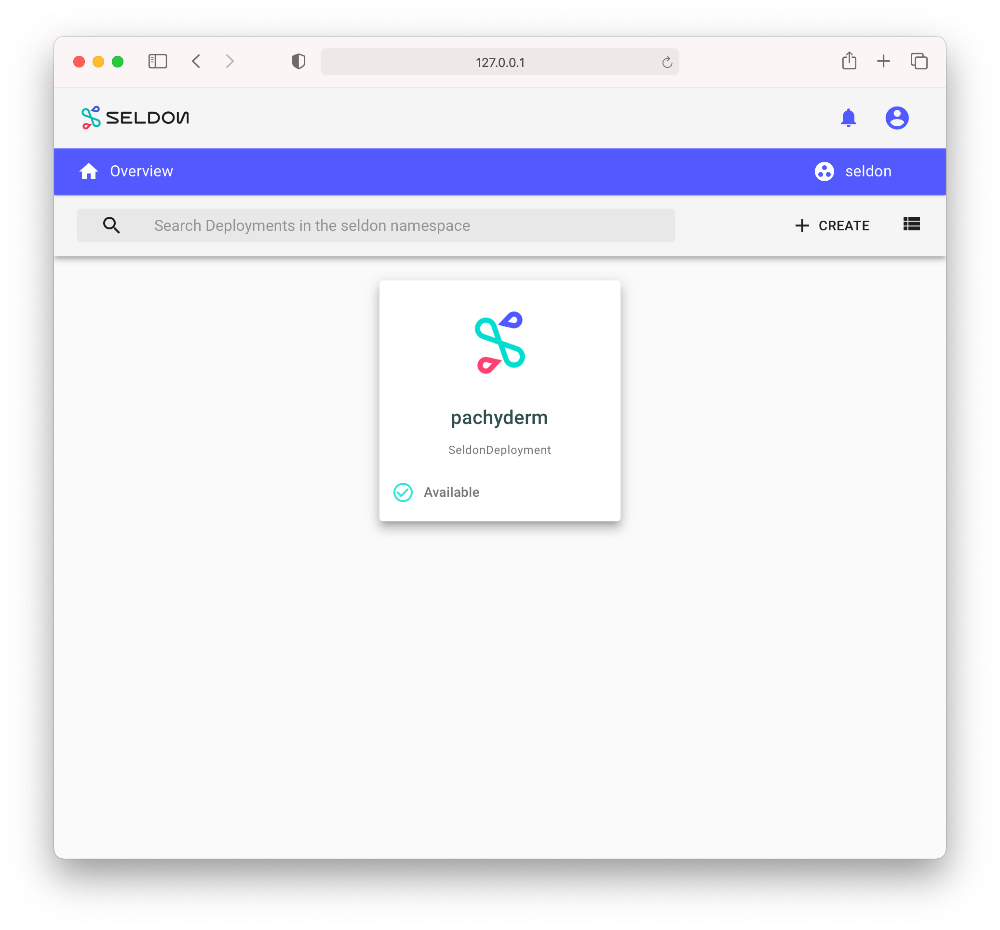

### Verify provenance

To verify models' provenance, the deploy pipeline injects an environment variable into Seldon containers that store the commit hash of the source `copy_models` commit. 
I check that with the help of a script, showing `deploy_production` and `master` point to the same commit, and the deployed models originate from the right `deploy_production` commit.

In [44]:
!chmod +x verify_deployment_version.sh
!./verify_deployment_version.sh

copy_models commits:
REPO        BRANCH COMMIT                           FINISHED      SIZE     PROGRESS DESCRIPTION
copy_models master d07b382c0fdd464798803281ac6ab3f4 3 minutes ago 13.08MiB ▇▇▇▇▇▇▇▇  


copy_models branches:
BRANCH            HEAD                             TRIGGER 
deploy_production d07b382c0fdd464798803281ac6ab3f4 -       
master            d07b382c0fdd464798803281ac6ab3f4 -       


Production main-model version:
d07b382c0fdd464798803281ac6ab3f4
Drift version:
d07b382c0fdd464798803281ac6ab3f4
Outlier version:


## Check Seldon-Drift for `v1`

At this point the `v1` deployment is up and running ready to consume incoming requests so I submit the first batch of data points.
The [`repo/data/` directory](https://github.com/winderresearch/pachyderm-seldon/tree/main/repo/data) hosts a number of datasets I'll use for this purpose.

Let's take the `repo/data/test_drift_explain_v1.json` file and drop it onto the "Predict / Upload JSON File" page in Seldon UI.
Click the Predict button, if it worked correctly Seldon'll return the predictions probabilities for each datapoint.

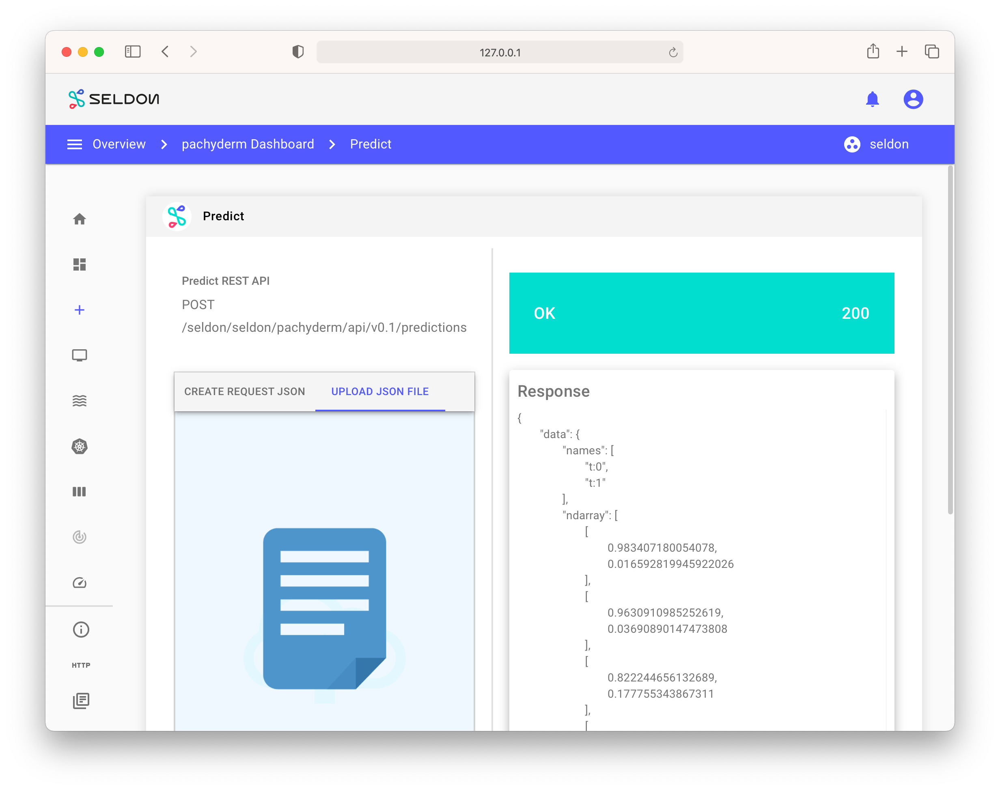

As illustrated earlier, the organization has put in place a monitoring process. As part of that, CreditCo want to make sure the model hasn't drifted.

I do that on the Monitoring page: selecting a proper date range shows whether model drift has occurred or not.

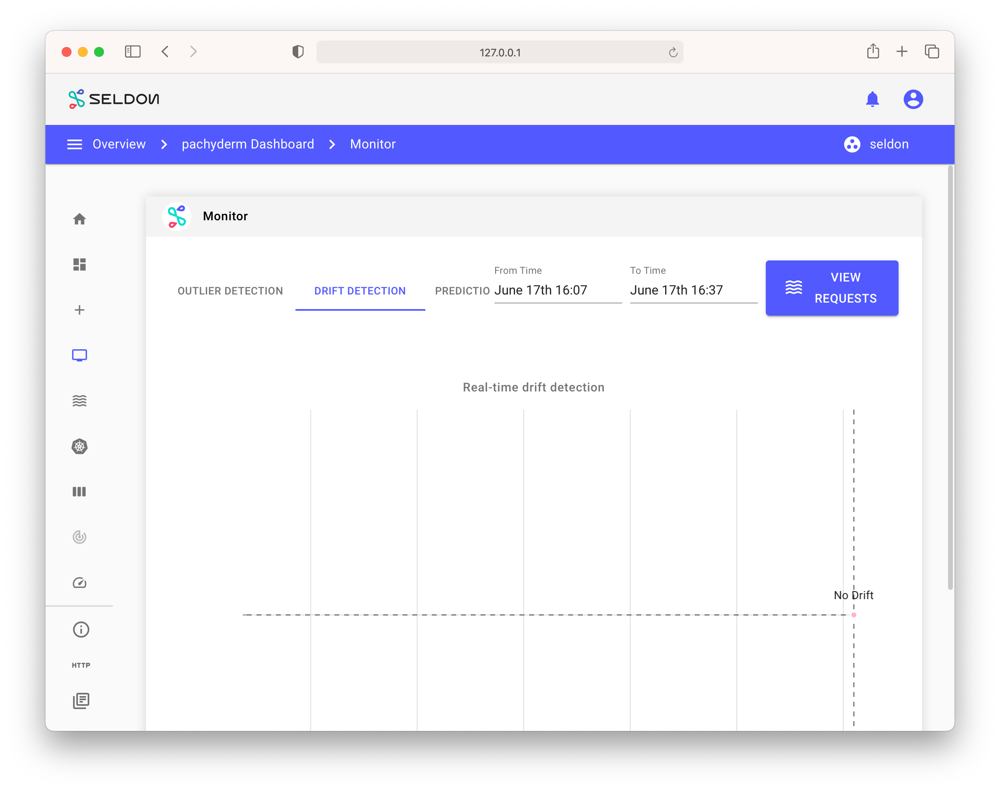


## Check Seldon-Explainer for `v1`

With `v1` being exposed to live data, CreditCo team executes the monitoring checklist by using the Explainer to verify if the creditworthiness predictions of certain clients may be generated by any controversial feature such as gender or race.
For the business unit's peace of mind, this validation returns a green light.

For demo purposes I do this just for a few data points although you may want to audit a larger amount of client requests.



The Explainer output shows that a particular prediction was made on the basis of a feature that has no reason to concern CreditCo, which is fine.


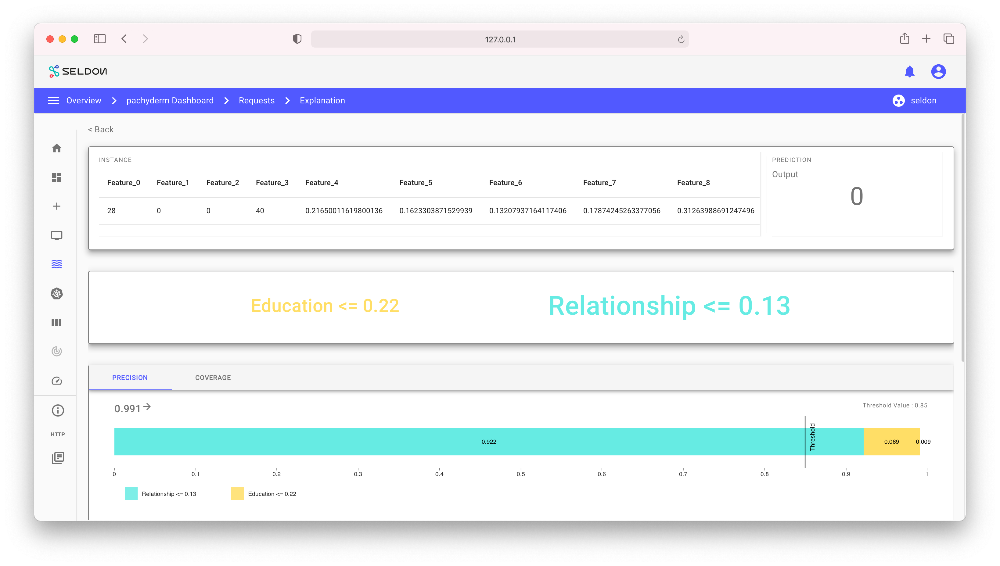

In [45]:
# clear Elasticsearch index to clean up the Requests page
!chmod +x clear_elastic.sh
!./clear_elastic.sh > /dev/null 2>&1

Everything's been quite calm until now, but a squall is approaching CreditCo.
Luckily, they rely upon a powerful infrastructure to manage the upcoming challenges.

When CreditCo launch in new locations they suddenly observe the model has drifted and prediction quality has deteriorated. What is happening? The Data Science team finds out a set of non-US native groups have shifted the actual data distribution: new locations bring more user diversity!

For demoing this scenario, I submit some rouge data points representing the new user groups to the prediction model.
Do this by uploading the `repo/data/test_drift2_v1.json` dataset to the "Predict / Upload JSON File" page.
Then, I check again the Monitoring UI and ascertain the model has drifted!

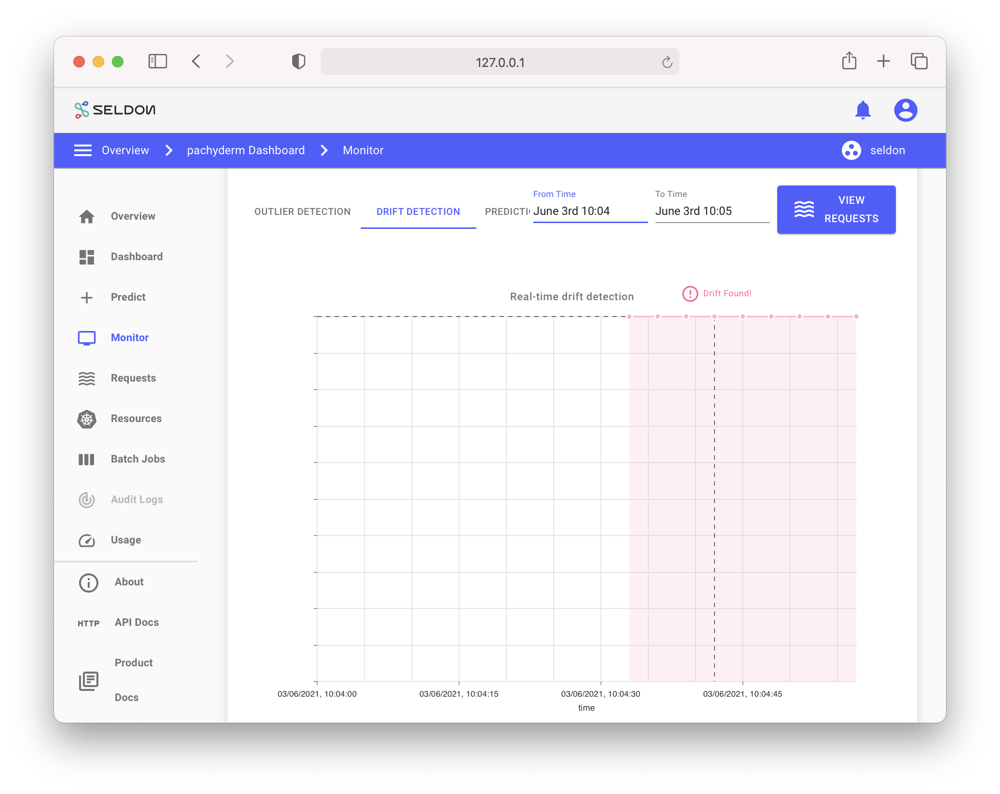

## Rollout `v2`

CreditCo has landed in deep waters because the prediction model no longer suitable for a delicate job such as creditworthiness assessment. To react quickly, the company acquire from a vendor a new dataset, namely `v2`, which comes adds enough data points to represent the new groups of customers. 

To roll out `v2`, all I need to do is: 

1. push the new training set to `income_data`
2. point `income_data@master` to `v2` branch so that Pachyderm automatically runs the training pipelines
3. point `copy_models@deploy_production` HEAD to `copy_models@master` so that the artifacts are deployed


Let's begin with populating the data repo with the newly acquired dataset.

In [46]:
!pachctl create branch income_data@v2
!pachctl start commit income_data@v2
!cd data && pachctl put file income_data@v2:/train.csv -f train_v2.csv --overwrite
!pachctl finish commit income_data@v2

afb973ae90a047d68e4edfd1cedf323b
train_v2.csv 0.00b / 796.89 KB [-----------------------------------] 0s 0.00 b/s
train_v2.csv 163.84KB / 796.89 KB [======>-------------------------] 0s 0.00 b/s
train_v2.csv 163.84KB / 796.89 KB [======>-------------------------] 0s 0.00 b/s
train_v2.csv 163.84KB / 796.89 KB [======>-------------------------] 0s 0.00 b/s
train_v2.csv 196.61KB / 796.89 KB [=======>------------------------] 0s 0.00 b/s
train_v2.csv 196.61KB / 796.89 KB [=======>------------------------] 0s 0.00 b/s
train_v2.csv 229.38KB / 796.89 KB [========>-----------------------] 0s 0.00 b/s
train_v2.csv 229.38KB / 796.89 KB [========>-----------------------] 0s 0.00 b/s
train_v2.csv 327.68KB / 796.89 KB [============>-------------------] 0s 0.00 b/s
train_v2.csv 327.68KB / 796.89 KB [============>-------------------] 0s 0.00 b/s
train_v2.csv 360.45KB / 796.89 KB [============>----------------] 1s 405.57 KB/s
train_v2.csv 393.22KB / 796.89 KB [=============>---------------] 1s 393.73 

Point `income_data@master` HEAD to `v2`. 
Since training pipelines watch `master` this triggers new training jobs.

In [47]:
!pachctl create branch income_data@master --head v2

Let's check the job list to verify they all succeeded, if that's the case I'm assured all training repositories host fresh artifacts, which I can copy over to `models` repo (in the next step).

In [48]:
!pachctl list job

ID                               PIPELINE           STARTED                DURATION   RESTART PROGRESS  DL       UL       STATE   
7161f187a8514d84973d6159a53c414d income_training    Less than a second ago -          0       0 + 0 / 1 0B       0B       running 
050567390b764f599682f7db8893a066 outlier_training   Less than a second ago -          0       0 + 0 / 1 0B       0B       running 
1fd3f6b7920f4af3b90adaa9ecdcd086 drift_training     Less than a second ago -          0       0 + 0 / 1 0B       0B       running 
5bc130ac52244f10a37f68035e6cc3fa deploy_production  3 minutes ago          -          0       0 + 0 / 0 0B       0B       running 
c4d8f18e0e4f4fa3a8af1461c6d5445e copy_models        4 minutes ago          2 seconds  0       4 + 0 / 4 0B       0B       success 
890e58c5002e435d89e5ce5fbb6718f8 outlier_training   4 minutes ago          6 seconds  0       1 + 0 / 1 5.422MiB 1.676KiB success 
5f0bbdfa2e824e658395bba1b585a379 drift_training     4 minutes ago          8 second

In [49]:
!pachctl list branch copy_models

BRANCH            HEAD                             TRIGGER 
deploy_production d07b382c0fdd464798803281ac6ab3f4 -       
master            0c0a10aaa8824bac9a36bcfe5403d0bb -       


It's enough to point `copy_models@deploy_production` to `master` branch to trigger the deployment pipeline!

In [50]:
!pachctl create branch copy_models@deploy_production --head master

In [51]:
!./wait_containers_rollout.sh

deployment "pachyderm-default-0-pachyderm-container" successfully rolled out
deployment "pachyderm-default-explainer" successfully rolled out
deployment "seldon-seldondeployment-pachyderm-drift-00001-deployment" successfully rolled out
deployment "seldon-seldondeployment-pachyderm-outlier-00001-deployment" successfully rolled out


In [52]:
!pachctl logs --pipeline=deploy_production

Models bucket URI: s3://copy_models
Model version: d07b382c0fdd464798803281ac6ab3f4
K8s service host: 10.35.240.1
S3 endpoint: http://s3-5bc130ac52244f10a37f68035e6cc3fa.pachyderm:600
Deployment name: pachyderm
create_seldon_deployment OK
create_drift_detector_seldon_deployment OK
create_outlier_detector_seldon_deployment OK
SeldonDeployment not ready yet
SeldonDeployment not ready yet
SeldonDeployment not ready yet
SeldonDeployment not ready yet
SeldonDeployment not ready yet
SeldonDeployment not ready yet
SeldonDeployment not ready yet
SeldonDeployment not ready yet
SeldonDeployment not ready yet
SeldonDeployment not ready yet
SeldonDeployment not ready yet
SeldonDeployment not ready yet
SeldonDeployment is ready!
DONE
Models bucket URI: s3://copy_models
Model version: 0c0a10aaa8824bac9a36bcfe5403d0bb
K8s service host: 10.35.240.1
S3 endpoint: http://s3-33e6795b92054c0da75a7a8dd5c7c47c.pachyderm:600
Deployment name: pachyderm


### Verify provenance

In [53]:
!./verify_deployment_version.sh

copy_models commits:
REPO        BRANCH COMMIT                           FINISHED      SIZE     PROGRESS DESCRIPTION
copy_models master 0c0a10aaa8824bac9a36bcfe5403d0bb 3 seconds ago 2.03MiB  ▇▇▇▇▇▇▇▇  
copy_models master d07b382c0fdd464798803281ac6ab3f4 4 minutes ago 13.08MiB ▇▇▇▇▇▇▇▇  


copy_models branches:
BRANCH            HEAD                             TRIGGER 
deploy_production 0c0a10aaa8824bac9a36bcfe5403d0bb -       
master            0c0a10aaa8824bac9a36bcfe5403d0bb -       


Production main-model version:
0c0a10aaa8824bac9a36bcfe5403d0bb
Drift version:

Outlier version:


## Monitoring throws a red flag

CreditCo constantly monitor the new deployment but soon the Outlier detector shows some incoming request are suspiciously off.

Similar to the previous steps, to demonstrate how outliers are detected in Seldon I submit `repo/data/test_v2.json` dataset which is characterized by unseen statistics.
The Requests page allows you to highlight outliers in red with the toggle on the top menu bar. 

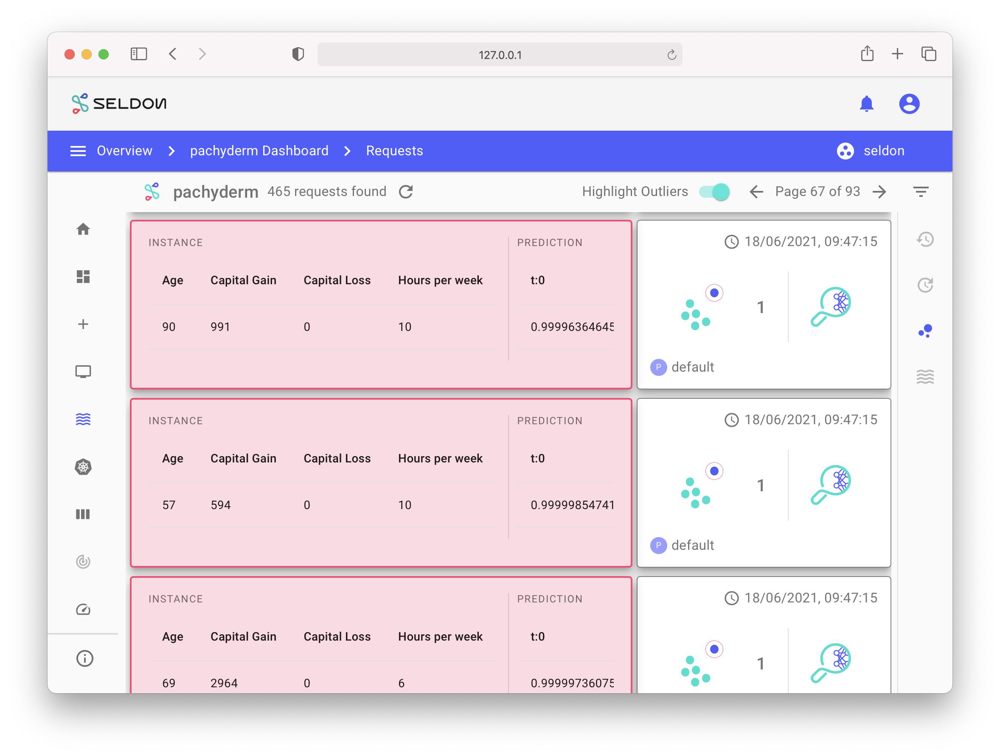


As per monitoring protocol, CreditCo Data Science team begin investigating these outlier requests, and after passing them through the Seldon-Explainer, they find out the model is making wrong inferences. 
After explaining a number of predictions, the DS team conclude the model is now predicting based on gender and systematically denying credit to Female clients.
This situation is a ticking bomb for CreditCo, if this unexpected behavior goes public they can run into a serious scandal.


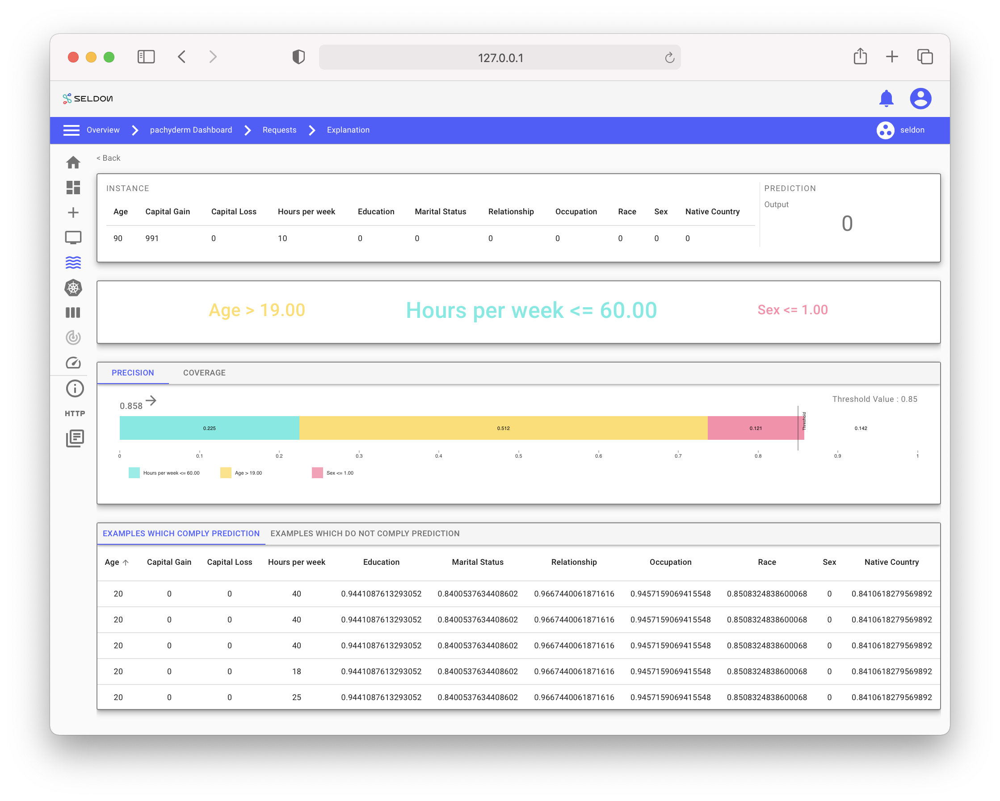

## Rollback to `v1`

The organization believe the problem is related to recently-added data because `v1` didn't present such an issue.
The clock is running and preparing a new training dataset will take time, so the data science team decides to roll back to the previous model namely `v1`.

To roll back, it's enough to point `copy_models@deploy_production` HEAD to its very first commit (which corresponds to dataset v1).

In [54]:
!pachctl list commit copy_models

REPO        BRANCH COMMIT                           FINISHED       SIZE     PROGRESS DESCRIPTION
copy_models master 0c0a10aaa8824bac9a36bcfe5403d0bb 51 seconds ago 2.03MiB  ▇▇▇▇▇▇▇▇  
copy_models master d07b382c0fdd464798803281ac6ab3f4 5 minutes ago  13.08MiB ▇▇▇▇▇▇▇▇  


In [55]:
!pachctl create branch copy_models@deploy_production --head $(pachctl list commit copy_models | awk '{print $3}' | tail -n 1)

In [56]:
!pachctl logs --pipeline=deploy_production

Models bucket URI: s3://copy_models
Model version: d07b382c0fdd464798803281ac6ab3f4
K8s service host: 10.35.240.1
S3 endpoint: http://s3-5bc130ac52244f10a37f68035e6cc3fa.pachyderm:600
Deployment name: pachyderm
create_seldon_deployment OK
create_drift_detector_seldon_deployment OK
create_outlier_detector_seldon_deployment OK
SeldonDeployment not ready yet
SeldonDeployment not ready yet
SeldonDeployment not ready yet
SeldonDeployment not ready yet
SeldonDeployment not ready yet
SeldonDeployment not ready yet
SeldonDeployment not ready yet
SeldonDeployment not ready yet
SeldonDeployment not ready yet
SeldonDeployment not ready yet
SeldonDeployment not ready yet
SeldonDeployment not ready yet
SeldonDeployment is ready!
DONE
Models bucket URI: s3://copy_models
Model version: 0c0a10aaa8824bac9a36bcfe5403d0bb
K8s service host: 10.35.240.1
S3 endpoint: http://s3-33e6795b92054c0da75a7a8dd5c7c47c.pachyderm:600
Deployment name: pachyderm
create_seldon_deployment OK
create_drift_detector_seldon_d

### Important

Since `v1` artifacts are had been created before, Pachyderm won't re-run any training job.
In fact, the models are still available in a previous commit. 
The next cell shows only the `deploy_production` job has run.
This behavior is quite efficient, imagine if a training run involved a massive dataset and computing power, it'd be costly and time-consuming.
Fortunately, Pachyderm caters to this scenario and allows an instant rollback.

In [57]:
!pachctl list job

ID                               PIPELINE           STARTED            DURATION   RESTART PROGRESS  DL       UL       STATE   
7a72c4edf3364eb1a92b84fcf4f2c057 deploy_production  2 seconds ago      -          0       0 + 0 / 0 0B       0B       running 
33e6795b92054c0da75a7a8dd5c7c47c deploy_production  55 seconds ago     52 seconds 0       0 + 0 / 0 0B       0B       success 
5de8d78d3a97451cb4ba0d03831932d3 copy_models        57 seconds ago     2 seconds  0       4 + 0 / 4 0B       0B       success 
94b18fa0c6d741a2858dd920b64e2fea explainer_training About a minute ago 6 seconds  0       1 + 0 / 1 779.1KiB 1.522MiB success 
7161f187a8514d84973d6159a53c414d income_training    About a minute ago 3 seconds  0       1 + 0 / 1 778.2KiB 878B     success 
050567390b764f599682f7db8893a066 outlier_training   About a minute ago 6 seconds  0       1 + 0 / 1 778.2KiB 1.676KiB success 
1fd3f6b7920f4af3b90adaa9ecdcd086 drift_training     About a minute ago 6 seconds  0       1 + 0 / 1 778.2KiB 51

In [58]:
!./wait_containers_rollout.sh

Waiting for deployment "pachyderm-default-0-pachyderm-container" rollout to finish: 0 of 1 updated replicas are available...
deployment "pachyderm-default-0-pachyderm-container" successfully rolled out
Waiting for deployment "pachyderm-default-explainer" rollout to finish: 0 of 1 updated replicas are available...
deployment "pachyderm-default-explainer" successfully rolled out
deployment "seldon-seldondeployment-pachyderm-drift-00001-deployment" successfully rolled out
deployment "seldon-seldondeployment-pachyderm-outlier-00001-deployment" successfully rolled out


### Verify provenance

In the current state, `deploy_production` is pointing to the first commit of `copy_models`. 
The deployment pipeline has then successfully deployed the related artifacts.

In [59]:
!./verify_deployment_version.sh

copy_models commits:
REPO        BRANCH COMMIT                           FINISHED           SIZE     PROGRESS DESCRIPTION
copy_models master 0c0a10aaa8824bac9a36bcfe5403d0bb About a minute ago 2.03MiB  ▇▇▇▇▇▇▇▇  
copy_models master d07b382c0fdd464798803281ac6ab3f4 5 minutes ago      13.08MiB ▇▇▇▇▇▇▇▇  


copy_models branches:
BRANCH            HEAD                             TRIGGER 
deploy_production d07b382c0fdd464798803281ac6ab3f4 -       
master            0c0a10aaa8824bac9a36bcfe5403d0bb -       


Production main-model version:
d07b382c0fdd464798803281ac6ab3f4
Drift version:
d07b382c0fdd464798803281ac6ab3f4
Outlier version:
d07b382c0fdd464798803281ac6ab3f4

## Create a Deployment Service for a staging model

Do you recall the `deploy_production` branch of `copy_models` I created halfway through this tutorial?
It's time to take a similar approach to deploy a staging model and validate its behavior in a controlled environment: only if it passes a validation process it'll be deployed in production.

I implement that with Seldon Deploy [shadow rollout strategy](https://deploy.seldon.io/docs/tour-of-seldon-deploy/rollout-strategies/shadow/), which pairs the production model with a shadow that effectively runs on the side without interfering with the "main" model.
The following pipeline updates the existing `SeldonDeployment` by adding a shadow model sourced from `copy_models@deploy_staging`.

In [60]:
!pachctl create branch copy_models@deploy_staging

In [106]:
%%writefile deploy_staging.json
{
  "pipeline": {
    "name": "deploy_staging"
  },
  "reprocess_spec": "every_job",
  "description": "A service deploys a set of Seldon components via the Seldon Deploy REST APIs.",
  "transform": {
    "image": "winderresearch/pachyderm-deployer:0.1.5",
    "cmd": ["/bin/bash"],
    "stdin": [
        "/usr/local/bin/python -u /add_shadow.py s3://copy_models ${KUBERNETES_SERVICE_HOST} ${S3_ENDPOINT} pachyderm ${copy_models_COMMIT}"
    ]
  },
  "parallelism_spec": {
    "constant": "1"
  },
  "input": {
    "pfs": {
      "repo": "copy_models",
      "branch": "deploy_staging",
      "glob": "/",
      "s3": true
    }
  },
  "enable_stats": false,
  "service": {
        "external_port": 30889,
        "internal_port": 600
  }
}

Overwriting deploy_staging.json


In [107]:
!pachctl create pipeline -f deploy_staging.json

The Pachyderm DAG in its final form:

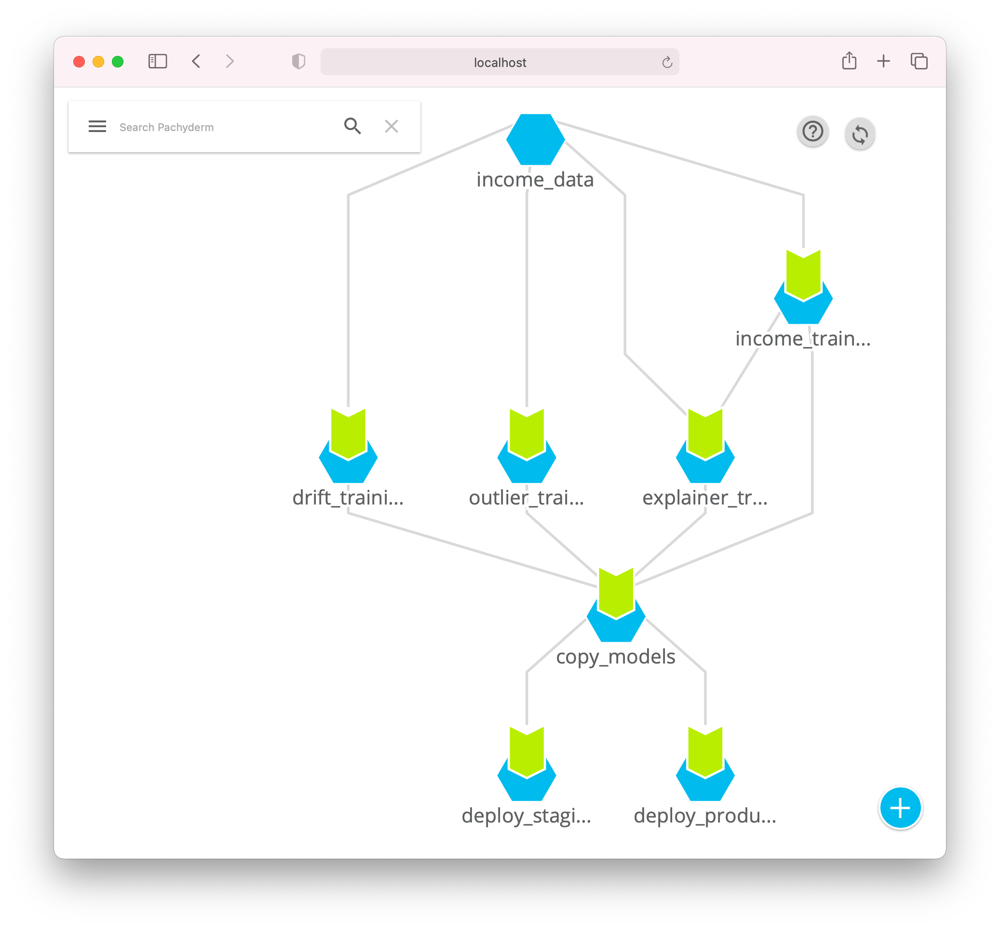

CreditCo obtain a new dataset, namely `v3`, that is deemed to be complete but must be carefully tested before going live.

As with `v2`, I push the new file to `income_data` and point `master` HEAD to the latest commit.

In [97]:
!pachctl create branch income_data@v3
!pachctl start commit income_data@v3
!cd data && pachctl put file income_data@v3:/train.csv -f train_v3.csv --overwrite
!pachctl finish commit income_data@v3

7ae65a716bf84a899afb4c43194e42da
train_v3.csv 163.84KB / 5.02 MB [>---------------------------------] 0s 0.00 b/s
train_v3.csv 163.84KB / 5.02 MB [>---------------------------------] 0s 0.00 b/s
train_v3.csv 163.84KB / 5.02 MB [>---------------------------------] 0s 0.00 b/s
train_v3.csv 163.84KB / 5.02 MB [>---------------------------------] 0s 0.00 b/s
train_v3.csv 163.84KB / 5.02 MB [>---------------------------------] 0s 0.00 b/s
train_v3.csv 163.84KB / 5.02 MB [>---------------------------------] 0s 0.00 b/s
train_v3.csv 196.61KB / 5.02 MB [>---------------------------------] 0s 0.00 b/s
train_v3.csv 196.61KB / 5.02 MB [>---------------------------------] 0s 0.00 b/s
train_v3.csv 196.61KB / 5.02 MB [>---------------------------------] 0s 0.00 b/s
train_v3.csv 196.61KB / 5.02 MB [>---------------------------------] 0s 0.00 b/s
train_v3.csv 196.61KB / 5.02 MB [>---------------------------------] 0s 0.00 b/s
train_v3.csv 229.38KB / 5.02 MB [=>--------------------------------] 0s 0.00

In [98]:
!pachctl list commit income_data

REPO        BRANCH COMMIT                           FINISHED               SIZE     PROGRESS DESCRIPTION
income_data v3     7ae65a716bf84a899afb4c43194e42da Less than a second ago 4.785MiB -         
income_data v3     52deadd10b19489fa30dda9071ee42a4 About a minute ago     4.785MiB ▇▇▇▇▇▇▇▇  
income_data v3     b9e7aa4c16bc4d069e851f995bf2b7ea 4 minutes ago          4.785MiB ▇▇▇▇▇▇▇▇  
income_data v3     08acff0f33134eddaf644ba1431fe002 18 minutes ago         4.785MiB ▇▇▇▇▇▇▇▇  
income_data v2     afb973ae90a047d68e4edfd1cedf323b 19 minutes ago         778.2KiB ▇▇▇▇▇▇▇▇  
income_data v1     fa8e99c84baa495bb30edd35e7671eef 25 minutes ago         5.422MiB ▇▇▇▇▇▇▇▇  


In [99]:
!pachctl create branch income_data@master --head v3

Once again, new models are trained and made available in `copy_models` by Pachyderm.

In [100]:
!pachctl list commit copy_models

REPO        BRANCH COMMIT                           FINISHED           SIZE     PROGRESS DESCRIPTION
copy_models master b7a26ceaed3e46c5a8bff988d693a692 -                  -        -         
copy_models master d25571f3554f4aa3bd880fb5429ab5ca About a minute ago 10.94MiB ▇▇▇▇▇▇▇▇  
copy_models master 9079df61aa1d4a519dc889917db9a488 4 minutes ago      10.94MiB ▇▇▇▇▇▇▇▇  
copy_models master d2e8309ff0a743d7a808cbd28859d027 17 minutes ago     10.94MiB ▇▇▇▇▇▇▇▇  
copy_models master 0c0a10aaa8824bac9a36bcfe5403d0bb 19 minutes ago     2.03MiB  ▇▇▇▇▇▇▇▇  
copy_models master d07b382c0fdd464798803281ac6ab3f4 24 minutes ago     13.08MiB ▇▇▇▇▇▇▇▇  


To deploy the staging model, it's enough to set `deploy_staging` HEAD to `master` commit.

In [101]:
!pachctl create branch copy_models@deploy_staging --head master

Pachyderm Dashboard shows the state of the three branches of `copy_models`:

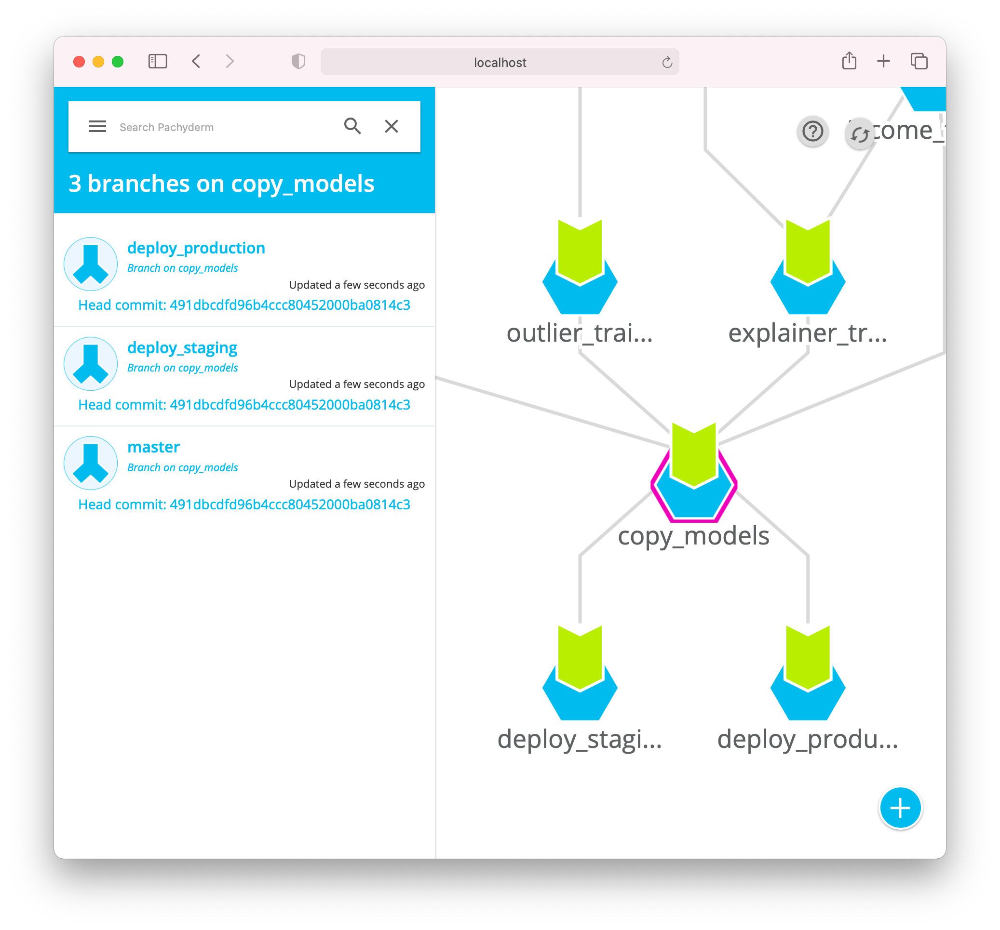

It's the first time I run the `deploy_staging` pipeline, let's check its logs to make sure it's deploying the right commit. The line `Model version` should match the topmost commit hash in the cell above.

In [109]:
# wait staging containers rollout
!sleep 10
!kubectl rollout status deployment -n seldon pachyderm-shadow-0-pachyderm-container

deployment "pachyderm-shadow-0-pachyderm-container" successfully rolled out


In [110]:
!pachctl logs --pipeline=deploy_staging

Models bucket URI: s3://copy_models
Model version: b7a26ceaed3e46c5a8bff988d693a692
K8s service host: 10.35.240.1
S3 endpoint: http://s3-8cc80f5fd7374646a0cc98d85e37b6af.pachyderm:600
Deployment name: pachyderm
Exception when calling SeldonDeploymentsApi->update_seldon_deployment: (500)
Reason: Internal Server Error
HTTP response headers: HTTPHeaderDict({'Content-Security-Policy': "script-src 'unsafe-eval' 'self';", 'Content-Type': 'application/json', 'Cross-Origin-Resource-Policy': 'same-site', 'Server': 'Seldon-Deploy-Server', 'X-Content-Type-Options': 'nosniff', 'X-Frame-Options': 'deny', 'X-Xss-Protection': '1; mode=block', 'Date': 'Wed, 07 Jul 2021 20:39:58 GMT', 'Content-Length': '362'})
HTTP response body: {"body":{"code":500,"message":"admission webhook \"v1.vseldondeployment.kb.io\" denied the request: SeldonDeployment.machinelearing.seldon.io \"pachyderm\" is invalid: [spec.predictors[2]: Invalid value: \"shadow\": Duplicate predictor name, spec: Invalid value: \"shadow\": Mu

Adding a shadow model is quick op: the pipeline adds a container to the existing `SeldonDeployment`.

### Verify provenance

Let's check the production and staging versions.
The output below now shows the staging version, which should report the latest commit hash (i.e., `v3`), while the production model should have the first commit in the history (i.e., `v1`).

In [111]:
!./verify_deployment_version.sh with_staging

copy_models commits:
REPO        BRANCH COMMIT                           FINISHED       SIZE     PROGRESS DESCRIPTION
copy_models master b7a26ceaed3e46c5a8bff988d693a692 3 minutes ago  10.94MiB ▇▇▇▇▇▇▇▇  
copy_models master d25571f3554f4aa3bd880fb5429ab5ca 4 minutes ago  10.94MiB ▇▇▇▇▇▇▇▇  
copy_models master 9079df61aa1d4a519dc889917db9a488 8 minutes ago  10.94MiB ▇▇▇▇▇▇▇▇  
copy_models master d2e8309ff0a743d7a808cbd28859d027 21 minutes ago 10.94MiB ▇▇▇▇▇▇▇▇  
copy_models master 0c0a10aaa8824bac9a36bcfe5403d0bb 23 minutes ago 2.03MiB  ▇▇▇▇▇▇▇▇  
copy_models master d07b382c0fdd464798803281ac6ab3f4 27 minutes ago 13.08MiB ▇▇▇▇▇▇▇▇  


copy_models branches:
BRANCH            HEAD                             TRIGGER 
deploy_staging    b7a26ceaed3e46c5a8bff988d693a692 -       
deploy_production d07b382c0fdd464798803281ac6ab3f4 -       
master            b7a26ceaed3e46c5a8bff988d693a692 -       


Production main-model version:
d07b382c0fdd464798803281ac6ab3f4
Drift version:
d07b382c0fdd464

Seldon Deploy UI now indicates with an **S** symbol that the `SeldonDeployment` runs a shadow model as well.


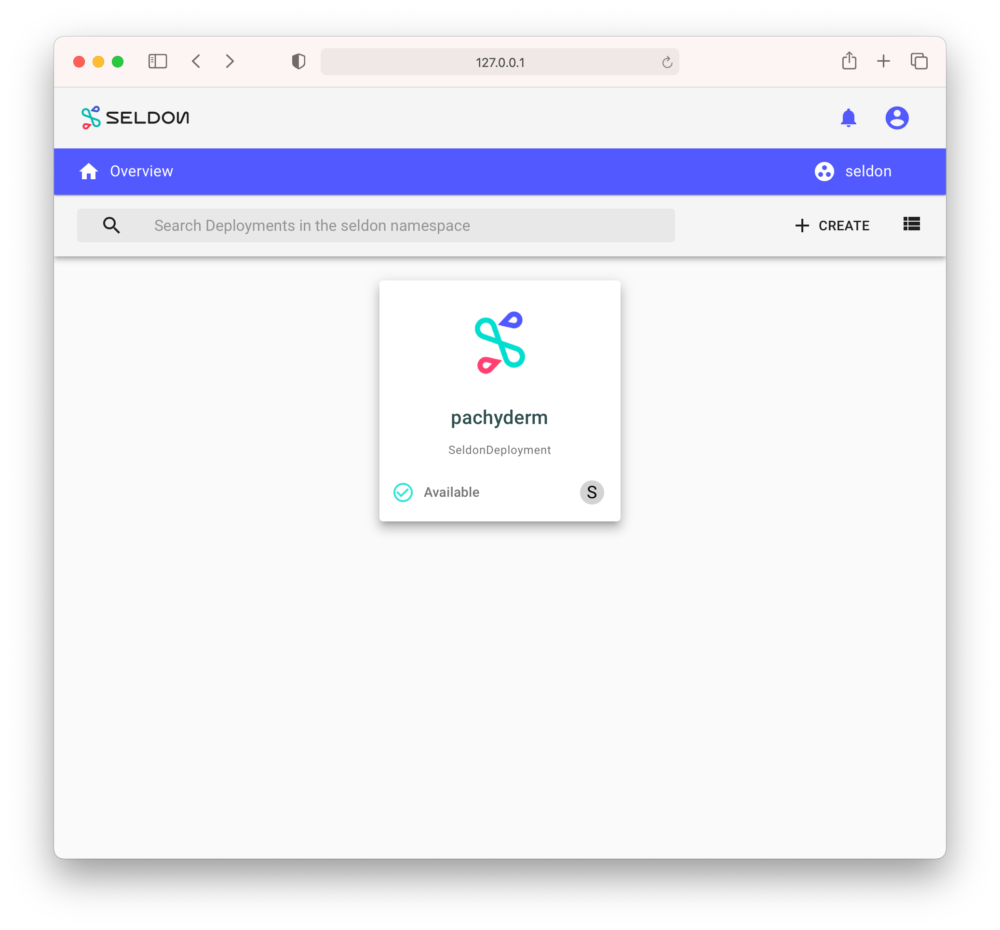

It's possible to promote a shadow to main with the click of a button but hang on a second because I'll show to achieve that with Pachyderm to preserve full provenance.

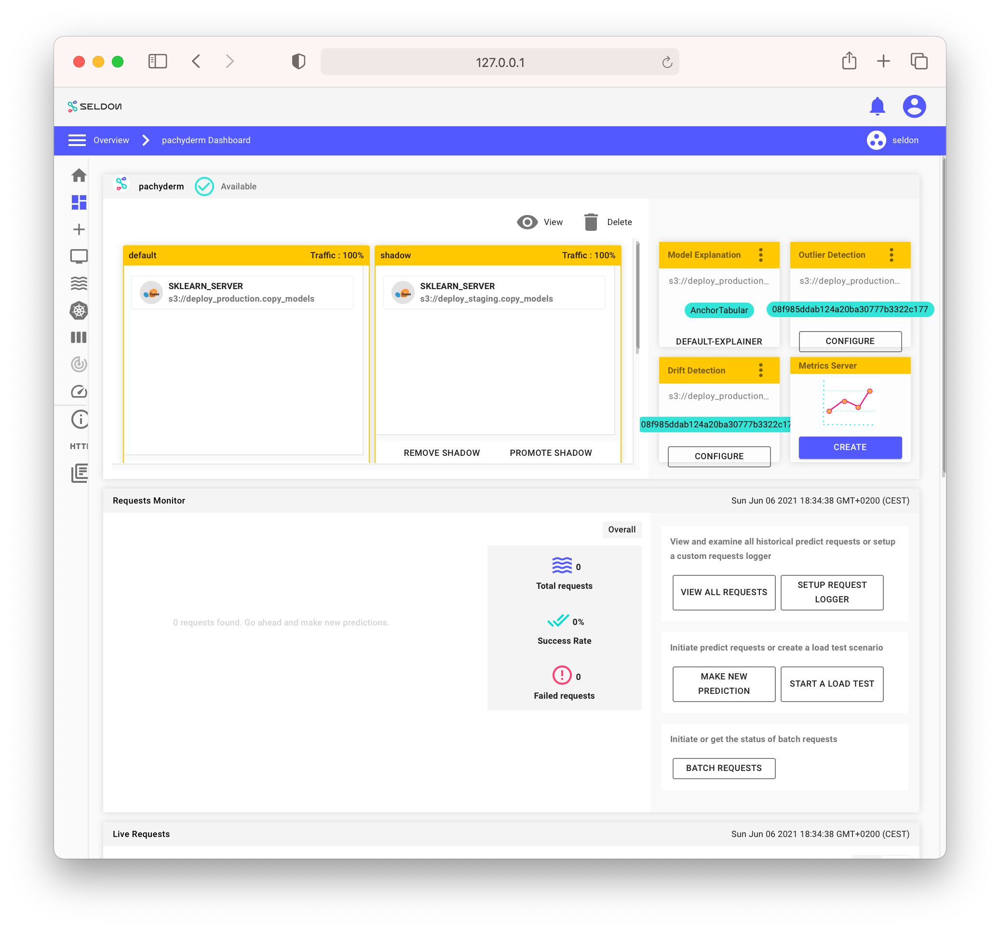

## Promote staging to master

CreditCo have completed their validation steps and are ready to go live with `v3`.

With Pachyderm all I need to do is point the production branch to the deploy_staging commit, and Pachyderm will take care of the rest.
For sake of brevity, I'll jump right onto the deployment phase.

In [112]:
!pachctl create branch copy_models@deploy_production --head deploy_staging

In [113]:
!pachctl logs --pipeline=deploy_production

Models bucket URI: s3://copy_models
Model version: d07b382c0fdd464798803281ac6ab3f4
K8s service host: 10.35.240.1
S3 endpoint: http://s3-5bc130ac52244f10a37f68035e6cc3fa.pachyderm:600
Deployment name: pachyderm
create_seldon_deployment OK
create_drift_detector_seldon_deployment OK
create_outlier_detector_seldon_deployment OK
SeldonDeployment not ready yet
SeldonDeployment not ready yet
SeldonDeployment not ready yet
SeldonDeployment not ready yet
SeldonDeployment not ready yet
SeldonDeployment not ready yet
SeldonDeployment not ready yet
SeldonDeployment not ready yet
SeldonDeployment not ready yet
SeldonDeployment not ready yet
SeldonDeployment not ready yet
SeldonDeployment not ready yet
SeldonDeployment is ready!
DONE
Models bucket URI: s3://copy_models
Model version: 0c0a10aaa8824bac9a36bcfe5403d0bb
K8s service host: 10.35.240.1
S3 endpoint: http://s3-33e6795b92054c0da75a7a8dd5c7c47c.pachyderm:600
Deployment name: pachyderm
create_seldon_deployment OK
create_drift_detector_seldon_d

In [114]:
!sleep 15
!./wait_containers_rollout.sh

Waiting for deployment "pachyderm-default-0-pachyderm-container" rollout to finish: 0 of 1 updated replicas are available...
deployment "pachyderm-default-0-pachyderm-container" successfully rolled out
deployment "pachyderm-default-explainer" successfully rolled out
deployment "seldon-seldondeployment-pachyderm-drift-00001-deployment" successfully rolled out
deployment "seldon-seldondeployment-pachyderm-outlier-00001-deployment" successfully rolled out


### Verify provenance

In [115]:
!./verify_deployment_version.sh

copy_models commits:
REPO        BRANCH COMMIT                           FINISHED       SIZE     PROGRESS DESCRIPTION
copy_models master b7a26ceaed3e46c5a8bff988d693a692 4 minutes ago  10.94MiB ▇▇▇▇▇▇▇▇  
copy_models master d25571f3554f4aa3bd880fb5429ab5ca 6 minutes ago  10.94MiB ▇▇▇▇▇▇▇▇  
copy_models master 9079df61aa1d4a519dc889917db9a488 9 minutes ago  10.94MiB ▇▇▇▇▇▇▇▇  
copy_models master d2e8309ff0a743d7a808cbd28859d027 22 minutes ago 10.94MiB ▇▇▇▇▇▇▇▇  
copy_models master 0c0a10aaa8824bac9a36bcfe5403d0bb 24 minutes ago 2.03MiB  ▇▇▇▇▇▇▇▇  
copy_models master d07b382c0fdd464798803281ac6ab3f4 28 minutes ago 13.08MiB ▇▇▇▇▇▇▇▇  


copy_models branches:
BRANCH            HEAD                             TRIGGER 
deploy_staging    b7a26ceaed3e46c5a8bff988d693a692 -       
deploy_production b7a26ceaed3e46c5a8bff988d693a692 -       
master            b7a26ceaed3e46c5a8bff988d693a692 -       


Production main-model version:
b7a26ceaed3e46c5a8bff988d693a692
Drift version:
b7a26ceaed3e46c

**That's all folks!**

## Summary

In this demo I have shown a full model *release, update, rollback, fix, re-release* cycle using Pachyderm pipelines.
At each step, the provenance and lineage between the data (version controlled) and the deployed model (also version controlled) are guaranteed and displayed clearly.

In this context, Pachyderm is used as an end-to-end application and its flexibility is twofold; it automates the tediously long steps of a ML setup such as the model training and deployment, while it provides a Data Science team with the power of deciding which model version goes live with a simple a one-liner command.

Lastly, I used Seldon to run ML models and monitor for the common issues that affect such setups (i.e. model drift, outlier detection, prediction explainability).